<a href="https://colab.research.google.com/github/Jingsai/CMPT300G/blob/master/project/Project_Step2_YOLO.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Teams

Teams are organized based on where you physically sit together in the classroom today. Let me know **as soon as possible** if you want to swap to a different team.

- Team 1: Omar and William and Tim 
- Team 2: Yuhao and Connor 
- Team 3: John Mohr and Taylor
- Team 4: John Foley and Jasper
- Team 5: Valeria and Julia 

## Folder and file structure

- Manage your folder in Google drive like this organization:

  ```
  pelican_project
  -- training_data
  ---- images
  ---- labels
  -- testing_data
  ---- images
  ---- labels
  -- project.ipynb
  -- data.yaml
  ```

- path to your files

  - path to temporary files under current colab file like: `/content/yolo`
  - path to your google drive like: `/content/drive/MyDrive/pelican_project`
  - path to shared google drive from your group members is same as above, but you must create a shortcut to the shared folder if you are not the creator of the folder. 

- yaml file 

  A text file for configuring path to data and info of classes. The content of a typical yaml file is:

  ```
  train: /content/drive/MyDrive/pelican/train_pelican/images  # train images 
  val: /content/drive/MyDrive/pelican/test_pelican/images   # val images 

  # Classes
  nc: 3  # number of classes
  names: [ 'flying', 'no_beak', 'beak']  # class names
  ```

  An example yaml file can be downloaded from [link](https://colab.research.google.com/github/Jingsai/CMPT300G/blob/master/project/data.yaml)

- YOLO folder structure

  ```
  yolov5
  -- runs
  ---- detect # detection results like pictures with boxes
  ---- train
  ------ exp/weights/best.pt # weights of first experiment
  ------ exp2 # folder of second experiment
  ---- val # evaluation results like mAP
  ```

## Code

### Step 1 - clone the yolo repo and load torch

In [ ]:
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -r requirements.txt 

import torch
from IPython.display import Image, clear_output  # to display images


Cloning into 'yolov5'...
remote: Enumerating objects: 12078, done.
remote: Total 12078 (delta 0), reused 0 (delta 0), pack-reused 12078
Receiving objects: 100% (12078/12078), 11.82 MiB | 22.89 MiB/s, done.
Resolving deltas: 100% (8382/8382), done.
/content/yolov5
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 596 kB 14.8 MB/s 
  Attempting uninstall: PyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13


### Step 2 - mount google drive

In [ ]:
from google.colab import drive
drive.mount("/content/drive", force_remount=True)

Mounted at /content/drive


In [ ]:
!ls '/content/drive/MyDrive/pelican'

 2022_YOLO_pelican.ipynb   control.yaml		 test_pelican
 augment		   flip.yaml		 train_better
 augment.gdoc		   pelican2.yaml	 train_pelican
 batch_1_999		   pelican.gdoc		 WC_2022_YOLO_pelican.ipynb
 boxPelican.JPG		  'Pelican paper.gdoc'	 weights
 bright.yaml		   pelican.yaml		 weird.yaml
 contrast.yaml		   saturation.yaml


### Step 3 - train the model

**Warning:** I tested my code on a pro colab. You may need to reduce img, batch or weights to aviod out of memory error if you are running on a free colab.

- img: resize the image
- batch
- epoch
- data: path to yaml file
- weights: <img src="https://github.com/ultralytics/yolov5/releases/download/v1.0/model_comparison.png">
- cache: save cache of the data.

In [ ]:
!python train.py --img 950 --batch 20 --epochs 100 --data '/content/drive/MyDrive/pelican/pelican2.yaml' --weights yolov5m.pt --cache 

train: weights=yolov5m.pt, cfg=, data=/content/drive/MyDrive/pelican/pelican2.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=100, batch_size=20, imgsz=950, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-223-g1dcb774 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0

Run it again using yolov5x.pt.

In [ ]:
!python train.py --img 640 --batch 15 --epochs 10 --data '/content/drive/MyDrive/pelican/pelican2.yaml' --weights yolov5x.pt --cache 

train: weights=yolov5x.pt, cfg=, data=/content/drive/MyDrive/pelican/pelican2.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=10, batch_size=15, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-223-g1dcb774 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0,

### Step 4 - save the model weights to your drive

- replace the weights you want to save
- replace the name in the new place in your folder

In [ ]:
!cp /content/yolov5/runs/train/exp/weights/best.pt /content/drive/MyDrive/pelican/weights/exp1_best.pt

In [ ]:
!ls /content/drive/MyDrive/pelican/weights

best.pt  exp1_best.pt


### Step 5 - launch tensorboard to visualize the model

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs/train

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1523), started 0:30:30 ago. (Use '!kill 1523' to kill it.)

<IPython.core.display.Javascript object>

### Step 6 - evaluation the model

- replace the path to source to your path.
- replace the weight to the best exp folder. 

In [ ]:
!python val.py --weights runs/train/exp/weights/best.pt --data '/content/drive/MyDrive/pelican/pelican2.yaml' --img 640

val: data=/content/drive/MyDrive/pelican/pelican2.yaml, weights=['runs/train/exp/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.001, iou_thres=0.6, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.1-223-g1dcb774 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model summary: 290 layers, 20861016 parameters, 0 gradients, 48.0 GFLOPs
val: Scanning '/content/drive/MyDrive/pelican/test_pelican/labels.cache' images and labels... 102 found, 0 missing, 0 empty, 0 corrupt: 100% 102/102 [00:00<?, ?it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 4/4 [00:10<00:00,  2.72s/it]
                 all        102        943      0.772      0.573      0.658      0.395
              flying        102         61      0.675      0.

### Step 7 - test the model and detect objects

- replace the path to source to your path.
- replace the weight to the best exp folder. 

In [ ]:
!python detect.py --source /content/drive/MyDrive/pelican/test_pelican/images --weights runs/train/exp/weights/best.pt --img 640


detect: weights=['runs/train/exp/weights/best.pt'], source=/content/drive/MyDrive/pelican/test_pelican/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-223-g1dcb774 Python-3.7.13 torch-1.11.0+cu113 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model summary: 290 layers, 20861016 parameters, 0 gradients, 48.0 GFLOPs
image 1/102 /content/drive/.shortcut-targets-by-id/1b3o8IX-65Ttb2cQsVh7OQUOSPKATm1rO/pelican/test_pelican/images/I_00100a.sd-g.JPG: 384x640 8 no_beaks, 2 beaks, Done. (0.014s)
image 2/102 /content/drive/.shortcut-targets-by-id/1b3o8IX-65Ttb2cQsVh7OQUOSPKATm1rO/pelican/test_pelican/images/I_00100b.sd-g.JPG: 384x640 

### Step 7 - show results

In [ ]:
!python detect.py --source /content/drive/MyDrive/pelican/test_pelican/images --weights /content/drive/MyDrive/pelican/weights/best.pt --img 640

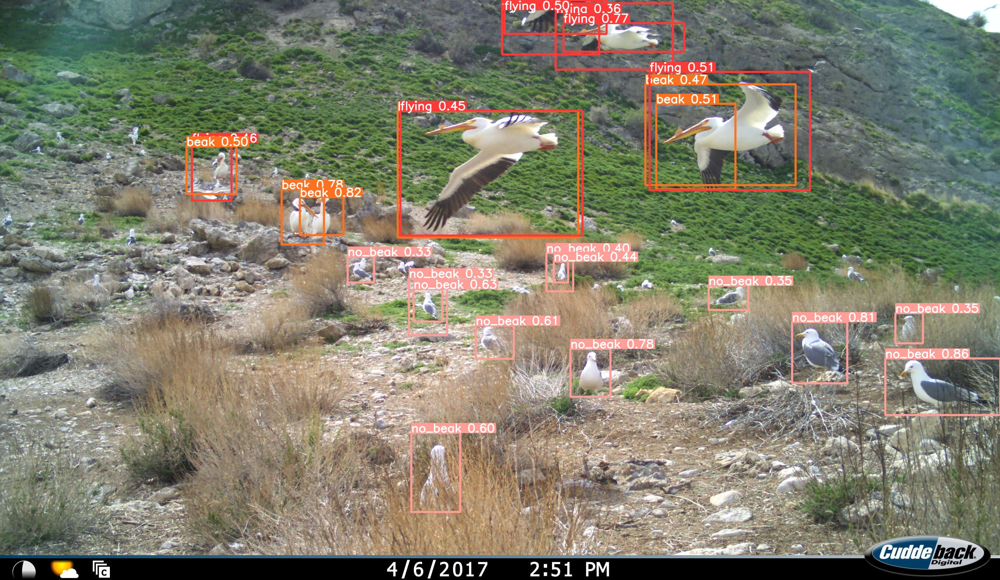

In [ ]:
Image(filename='runs/detect/exp/I_00319c.sd-g.JPG', width=1200)

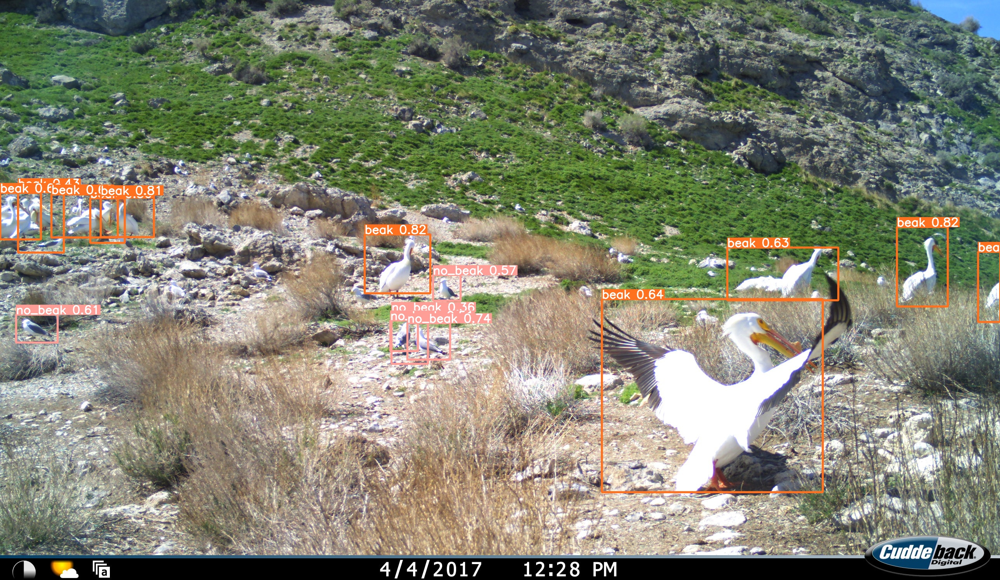

In [ ]:
Image(filename='runs/detect/exp/I_00237a.sd-g.JPG', width=1000)

## Submission

A shared link to your google drive. 